In [1]:
import sunpy
import sunpy.map
import numpy as np
from math import *
import astropy.units as u
from astropy.io import fits
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sunpy.coordinates import frames
import matplotlib.gridspec as gridspec
from scipy.interpolate import interp1d
from astropy.coordinates import SkyCoord
from matplotlib.patches import ConnectionPatch
import os,cv2
from scipy.optimize import fmin
from scipy.ndimage import affine_transform
import shutil
from scipy.io import readsav
import glob
from matplotlib.patches import Rectangle
from sunpy.physics.differential_rotation import solar_rotate_coordinate
from copy import deepcopy
from scipy.ndimage import shift

In [2]:
dir=r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\.94.sav'
data=readsav(dir)

In [4]:
dir1600=r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\1600.sav'
dir1700=r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\1700.sav'
data1600=readsav(dir1600)['matrix_struct']
data1700=readsav(dir1700)['matrix_struct']

In [3]:
print(data1600.keys())

dict_keys(['matrix_struct'])


In [7]:
a=data1600[0][0]

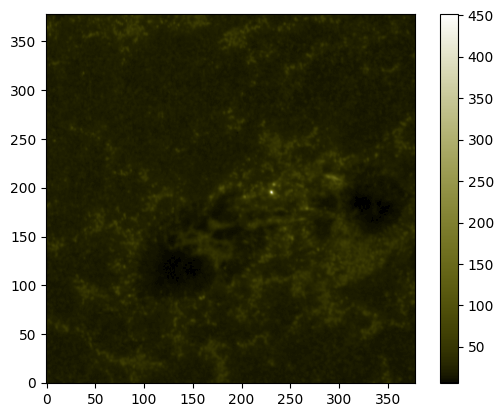

In [10]:
plt.imshow(data1600[10][0],cmap='sdoaia1600',origin='lower')
plt.colorbar()

In [3]:
import matplotlib.pyplot as plt

import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.visualization import ImageNormalize, SqrtStretch

import sunpy.map
from sunpy.coordinates import propagate_with_solar_surface

In [10]:
fdir=r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\1600\\'
ff=sorted(glob.glob(fdir+'*.fits'))

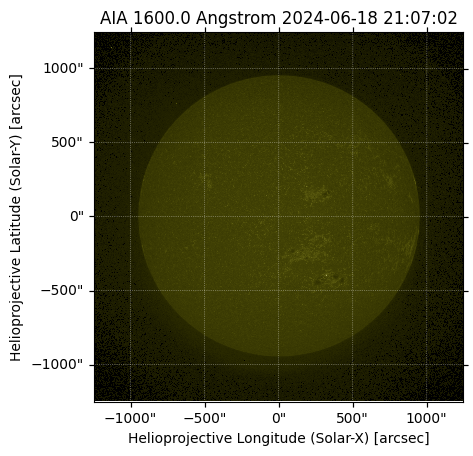

In [11]:
aia_sequence = sunpy.map.Map(ff, sequence=True)

fig = plt.figure()
ax = fig.add_subplot(projection=aia_sequence[0])
norm = norm=ImageNormalize(vmin=0, vmax=3e3, stretch=SqrtStretch())
ani = aia_sequence.plot(axes=ax, norm=norm)

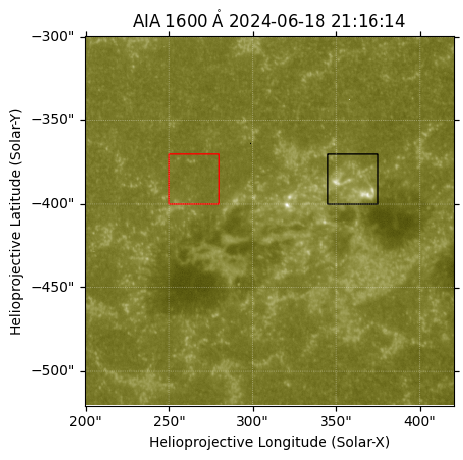

In [12]:
time_index=23
corner = SkyCoord(Tx=200*u.arcsec, Ty=-520*u.arcsec, frame=aia_sequence[time_index].coordinate_frame)
cutout_map = aia_sequence[time_index].submap(corner, width=220*u.arcsec, height=220*u.arcsec)
bottom_left=SkyCoord(Tx=345*u.arcsec,Ty=-400*u.arcsec,frame=aia_sequence[time_index].coordinate_frame)
top_right=SkyCoord(Tx=375*u.arcsec,Ty=-370*u.arcsec,frame=aia_sequence[time_index].coordinate_frame)
bottom_left_quiet=SkyCoord(Tx=250*u.arcsec,Ty=-400*u.arcsec,frame=aia_sequence[time_index].coordinate_frame)   
top_right_quiet=SkyCoord(Tx=280*u.arcsec,Ty=-370*u.arcsec,frame=aia_sequence[time_index].coordinate_frame)
fig = plt.figure()
ax = fig.add_subplot(projection=cutout_map)
cutout_map.plot(axes=ax)
#cutout_map.plot(axes=ax,clip_interval=(0,99.99)*u.percent)
cutout_map.draw_quadrangle(bottom_left,top_right=top_right,axes=ax,edgecolor='black')
cutout_map.draw_quadrangle(bottom_left_quiet,top_right=top_right_quiet,axes=ax,edgecolor='red')

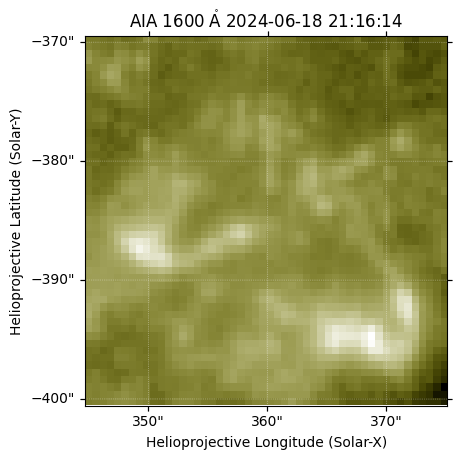

In [21]:
sub_map=cutout_map.submap(bottom_left,top_right=top_right)
fig=plt.figure()
ax=fig.add_subplot(projection=sub_map)
sub_map.plot(axes=ax)

In [34]:
print(cutout_map.wcs)

WCS Keywords

Number of WCS axes: 2
CTYPE : 'HPLN-TAN' 'HPLT-TAN' 
CRVAL : 0.0 0.0 
CRPIX : -326.89307 855.0144 
PC1_1 PC1_2  : 0.99999994066797 -0.00034447649857259 
PC2_1 PC2_2  : 0.00034447649857259 0.99999994066797 
CDELT : 0.00016927027027778 0.00016927027027778 
NAXIS : 362  363


In [ ]:
with propagate_with_solar_surface():
    aia_sequence_aligned = sunpy.map.Map([m.reproject_to(cutout_map.wcs) for m in aia_sequence], sequence=True)

KeyboardInterrupt: 

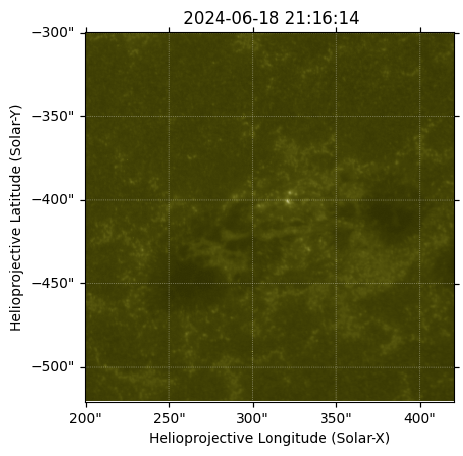

In [39]:
fig = plt.figure()
ax = fig.add_subplot(projection=aia_sequence_aligned[0])
ani = aia_sequence_aligned.plot(axes=ax, cmap='sdoaia1600', norm=norm)
plt.show()


In [22]:
from IPython.display import HTML

# 绘图和动画代码（你已经写好了）

# 这句显示动画
HTML(ani.to_jshtml())


In [24]:
ani.save('animation.gif', writer='imagemagick')


MovieWriter imagemagick unavailable; using Pillow instead.


In [24]:
import matplotlib.pyplot as plt

import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.wcs import WCS

import sunpy.map
from sunpy.coordinates import Helioprojective, propagate_with_solar_surface
from sunpy.data.sample import AIA_171_IMAGE

In [25]:
aiamap = sunpy.map.Map(AIA_171_IMAGE)
in_time = aiamap.date

In [26]:
print(in_time)

2011-06-07T06:33:02.770


## 下面是针对1600，1700耀斑区谱线强度随时间变化的计算

In [23]:
dir1600=r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\1600\\'
dir1700=r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\1700\\'

ff1600=sorted(glob.glob(dir1600+'*.fits'))
ff1700=sorted(glob.glob(dir1700+'*.fits'))

aia_sequence1600=sunpy.map.Map(ff1600,sequence=True)
aia_sequence1700=sunpy.map.Map(ff1700,sequence=True)


In [5]:
def get_submap(map,x1,x2,y1,y2):
    xy1 = SkyCoord(x1*u.arcsec, y1*u.arcsec, frame=map.coordinate_frame)
    xy2 = SkyCoord(x2*u.arcsec, y2*u.arcsec, frame=map.coordinate_frame)
    submap = map.submap(xy1,top_right=xy2)
    return submap

def de_rotate(file,map_start,sub=False):
    if 'hmi' in file:
        map = sunpy.map.Map(file).rotate()
    else:
        map = sunpy.map.Map(file)
    center = map_start.center
    x0,y0 = map_start.wcs.world_to_pixel(center)
    new_coordinate = solar_rotate_coordinate(center,observer=map.observer_coordinate)
    if sub==False:
        dx = map_start.data.shape[1]*map_start.meta['cdelt1']
        dy = map_start.data.shape[0]*map_start.meta['cdelt1']
        x1,x2 = new_coordinate.Tx.value-dx/2,new_coordinate.Tx.value+dx/2
        y1,y2 = new_coordinate.Ty.value-dy/2,new_coordinate.Ty.value+dy/2
        sub_xy1 = SkyCoord(x1*u.arcsec, y1*u.arcsec, frame=map.coordinate_frame)
        sub_xy2 = SkyCoord(x2*u.arcsec, y2*u.arcsec, frame=map.coordinate_frame)
        map = map.submap(sub_xy1,top_right=sub_xy2)

    x1,y1 = map.wcs.world_to_pixel(new_coordinate)
    shifted_data = shift(deepcopy(map.data), [y0-y1,x0-x1],mode='nearest')
    newmeta = deepcopy(map.meta)
    newmap = sunpy.map.Map(shifted_data,newmeta)
    return newmap
amap_ = sunpy.map.Map(r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\1600\aia.lev1_uv_24s.2024-06-18T211816Z.1600.image_lev1.fits')
submap = get_submap(amap_,500,650,-400,-250)

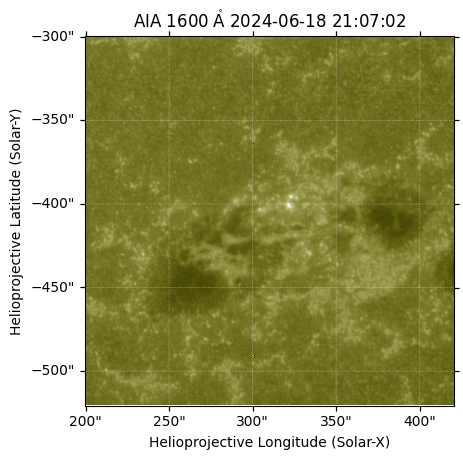

In [ ]:
image_path=r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\1600\aia.lev1_uv_24s.2024-06-18T210704Z.1600.image_lev1.fits'
new_map=de_rotate(image_path,amap_,sub=False)
#amap = sunpy.map.Map(image_path)
submap = get_submap(new_map,200,420,-520,-300)
fig=plt.figure()
ax=fig.add_subplot(projection=submap)
submap.plot(axes=ax)

In [8]:
amap_ = sunpy.map.Map(r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\1600\aia.lev1_uv_24s.2024-06-18T211816Z.1600.image_lev1.fits')
dir1600=r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\1600\\'
dir1700=r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\1700\\'

ff1600=sorted(glob.glob(dir1600+'*.fits'))
ff1700=sorted(glob.glob(dir1700+'*.fits'))
#第一列是活动区的平均值，第二列是宁静区
avg_1600=np.zeros((52,2))
avg_1700=np.zeros((52,2))
#计算区域位置
#活动区
bottom_left=SkyCoord(Tx=345*u.arcsec,Ty=-400*u.arcsec,frame=amap_.coordinate_frame)
top_right=SkyCoord(Tx=375*u.arcsec,Ty=-370*u.arcsec,frame=amap_.coordinate_frame)
#宁静区
bottom_left_quiet=SkyCoord(Tx=250*u.arcsec,Ty=-400*u.arcsec,frame=amap_.coordinate_frame)   
top_right_quiet=SkyCoord(Tx=280*u.arcsec,Ty=-370*u.arcsec,frame=amap_.coordinate_frame)

for i in range(58):
    new_map1600=de_rotate(ff1600[i],amap_,sub=False)
    new_map1700=de_rotate(ff1700[i],amap_,sub=False)
    submap1600 = get_submap(sunpy.map.Map(ff1600[i]),200,420,-520,-300)
    submap1700 = get_submap(sunpy.map.Map(ff1700[i]),200,420,-520,-300)
    fig=plt.figure()
    ax=fig.add_subplot(projection=submap1600)
    submap1600.plot(axes=ax)
    plt.savefig(r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\1600fig\\'+str(i).zfill(2)+'.png')
    plt.close()
    fig=plt.figure()
    ax=fig.add_subplot(projection=submap1700)    
    submap1700.plot(axes=ax)
    plt.savefig(r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\1700fig\\'+str(i).zfill(2)+'.png')
    plt.close()
    #画出该区域
    # sub_map1600_active=new_map1600.submap(bottom_left,top_right=top_right)
    # sub_map1600_quiet=new_map1600.submap(bottom_left_quiet,top_right=top_right_quiet)
    # sub_map1700_active=new_map1700.submap(bottom_left,top_right=top_right)
    # sub_map1700_quiet=new_map1700.submap(bottom_left_quiet,top_right=top_right_quiet)
    # #计算平均值
    # avg_1600[i,0]=sub_map1600_active.data.mean()
    # avg_1600[i,1]=sub_map1600_quiet.data.mean()
    # avg_1700[i,0]=sub_map1700_active.data.mean()
    # avg_1700[i,1]=sub_map1700_quiet.data.mean()
    print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57


In [66]:
from datetime import datetime, timedelta

# 定义起始时间
start_time = datetime.fromisoformat('2024-06-18T21:07:02.126')
# 定义每次增加的时间间隔
interval = timedelta(seconds=24)

# 生成时间序列
time_sequence = []
for i in range(52):
    current_time = start_time + i * interval
    # 格式化时间为只显示到秒
    time_str = current_time.strftime('%Y-%m-%dT%H:%M:%S')
    time_str=time_str[11:]
    time_sequence.append(time_str)
# 打印前10个时间字符串以验证
for time_str in time_sequence[:5]:
    print(time_str)

21:07:02
21:07:26
21:07:50
21:08:14
21:08:38


In [65]:
a=time_sequence[0]
print(a)
print(a[11:])

2024-06-18T21:07:02
21:07:02


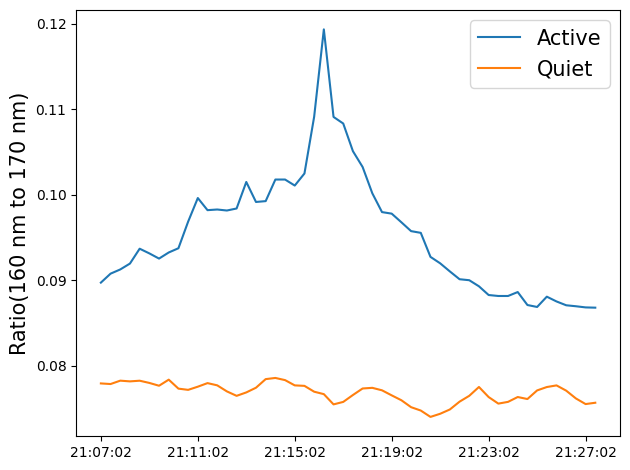

In [72]:

active=avg_1600[:,0]/avg_1700[:,0]
quiet=avg_1600[:,1]/avg_1700[:,1]
# 选取若干索引作为xticks
indices = list(range(0, len(time_sequence), 10))  # 每隔10个点取一个
selected_times = [time_sequence[i] for i in indices]

plt.plot(time_sequence, active, label='Active')
plt.plot(time_sequence, quiet, label='Quiet')
plt.legend(fontsize=15)
plt.ylabel('Ratio(160 nm to 170 nm)',fontsize=15)
# 设置xticks
plt.xticks(indices, selected_times)
plt.tight_layout()
plt.show()


In [14]:
import cv2
import os

def images_to_video(image_folder, output_folder, video_name, fps):
    images = [img for img in os.listdir(image_folder) if img.endswith(".png")]
    images=images[1::2]
    frame = cv2.imread(os.path.join(image_folder, images[0]))
    height, width, layers = frame.shape

    output_path = os.path.join(output_folder, video_name)
    video = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'XVID'), fps, (width,height))

    for image in images:
        video.write(cv2.imread(os.path.join(image_folder, image)))

    cv2.destroyAllWindows()
    video.release()
# images_to_video(r'D:\Learning\PHD1st\magnetic_reconnecion\data\CHASE_Ha_image\hacore\\'
#                 ,r'D:\Learning\PHD1st\magnetic_reconnecion\data\CHASE_Ha_image\\','CHASE_Ha_core.avi',3)
images_to_video(r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\1700fig\\'
                ,r'D:\Learning\PHD1st\magnetic_reconnecion\data\AIA2\\','1700.avi',3)